# Homework 1: Interpretations

1. Write down briefly what an explanation is, what makes an explanation local or global, model-agnostic and model-specific.
2. Choose a tabular dataset for regression or classification from sklearn.datasets, find one on Kaggle Datasets, or use one from the notebook provided.
3. Train a neural network or XGBoost model on it (this is f ), for regression or classification.
4. Train a linear/logistic regression and a decision tree classifier/regressor surrogate model on the data and predictions from f (this is g).
5. Create a global explanation from the surrogate model.
6. Pick a single datapoint and explain the prediction of f locally, using the surrogate model g.

In [ ]:
import pandas as pd
import numpy as np
import random

import matplotlib.pyplot as plt

import seaborn as sns

from sklearn.metrics import r2_score, mean_squared_error
from sklearn.utils import resample
from sklearn import metrics
from sklearn.datasets import make_classification
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, accuracy_score, log_loss

### what is an explanation and its properties

An explanation is an interpretation that makes a model behaviour understandable for humans.

The explanation is **Local** when the explanation is for a single data point / prediction, and **global** When the  explanation is for the whole model.


**Model-specific:** The explanation method exploits or depends on the model architecture.
**Model-agnostic:** The explanation method does not exploit or depend on the model.


###choosing a dataset

In [ ]:
from sklearn.datasets import load_breast_cancer
import pandas as pd

data = load_breast_cancer()


### training an xgboost classifier on it

In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

X = pd.DataFrame(data.data, columns=data.feature_names)
y = pd.Series(data.target)

X_train_bc, X_test_bc, y_train_bc, y_test_bc = train_test_split(X, y, test_size=0.2, random_state=42)

model_xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
model_xgb.fit(X_train_bc, y_train_bc)

y_pred_xgb = model_xgb.predict(X_test_bc)
accuracy_xgb = accuracy_score(y_test_bc, y_pred_xgb)
print(f"XGBoost Classifier Accuracy: {accuracy_xgb:.4f}")

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [08:02:29] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGBoost Classifier Accuracy: 0.9561


### training a linear regression and a descision tree classifier on to mimic the ouput of our xgboost model:

In [ ]:
X_surrogate = X_train_bc
y_pred_lr = model_xgb.predict_proba(X_surrogate)[:,1]
y_pred_cl = model_xgb.predict(X_surrogate)
y_surrogate_lr = pd.Series(y_pred_lr, name='xgb_prediction')
y_surrogate_cl = pd.Series(y_pred_cl, name='xgb_prediction')

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
import numpy as np # Import numpy for rounding

# Instantiate Linear Regression model
lr_surrogate = LinearRegression()

# Fit the model to the surrogate data (XGBoost predictions on training data)
lr_surrogate.fit(X_surrogate, y_surrogate_lr)

# Get XGBoost predictions on the test set, which is the target for surrogate evaluation
y_pred_xgb_test = model_xgb.predict(X_test_bc)

# Predict with Linear Regression surrogate and round to the nearest integer
y_pred_lr_surrogate = lr_surrogate.predict(X_test_bc)
y_pred_lr_surrogate_rounded = np.round(y_pred_lr_surrogate)

# Calculate and print accuracy for Linear Regression surrogate
accuracy_lr_surrogate = accuracy_score(y_pred_xgb_test, y_pred_lr_surrogate_rounded)
print(f"Linear Regression Surrogate Model Accuracy: {accuracy_lr_surrogate:.4f}")

# Instantiate Decision Tree Classifier
tree_surrogate = DecisionTreeClassifier(random_state=42) # Added random_state for reproducibility

# Fit the model to the surrogate data
tree_surrogate.fit(X_surrogate, y_surrogate_cl)

# Predict with Decision Tree Classifier surrogate
y_pred_tree_surrogate = tree_surrogate.predict(X_test_bc)

# Calculate and print accuracy for Decision Tree Classifier surrogate
accuracy_tree_surrogate = accuracy_score(y_pred_xgb_test, y_pred_tree_surrogate)
print(f"Decision Tree Surrogate Model Accuracy: {accuracy_tree_surrogate:.4f}")

Linear Regression Surrogate Model Accuracy: 0.9737
Decision Tree Surrogate Model Accuracy: 0.9912


##

### global explanations of our classifier using the surrogate models

Linear Regression Surrogate Model Coefficients (Global Explanation):


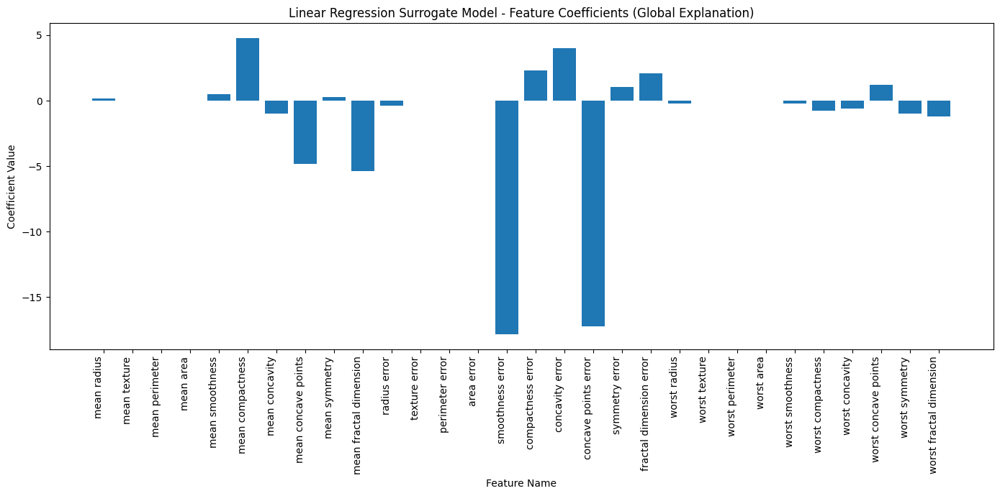

In [ ]:
#global explanations of our model_xgb using our lr_surrogate model and our tree_surrogate model

import matplotlib.pyplot as plt
import numpy as np

# For the linear model, compute the effect of the features and plot it on a bar chart.
print("Linear Regression Surrogate Model Coefficients (Global Explanation):")
feature_names_lr = X_surrogate.columns
coefficients_lr = lr_surrogate.coef_

plt.figure(figsize=(14, 7))
plt.bar(feature_names_lr, coefficients_lr)
plt.xlabel("Feature Name")
plt.ylabel("Coefficient Value")
plt.title("Linear Regression Surrogate Model - Feature Coefficients (Global Explanation)")
plt.xticks(rotation=90, ha='right')
plt.tight_layout()
plt.show()





the linear surrogate model suggests us that features like : `smoothness error`, ` concave points error` contribute greatly to push the model to predict 0, while the `mean compactness`, and `concavity error` contribute greatly for the positive output.


Decision Tree Classifier Surrogate Model Feature Importances (Global Explanation):


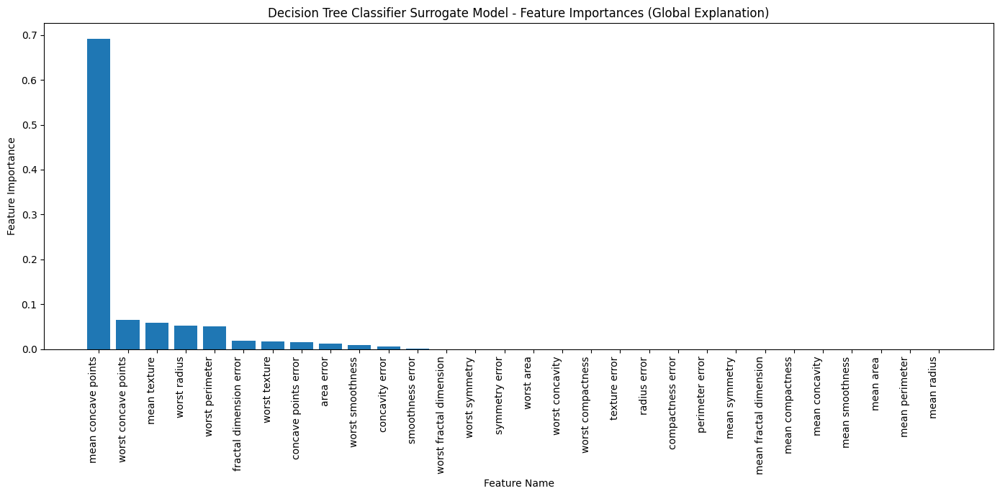

In [ ]:
# For the decision tree classifier, get the feature importance and plot it on a bar chart
print("\nDecision Tree Classifier Surrogate Model Feature Importances (Global Explanation):")
feature_importances_dt = tree_surrogate.feature_importances_
feature_names_dt = X_surrogate.columns

# Sort feature importances for better visualization
sorted_indices_dt = np.argsort(feature_importances_dt)[::-1]
sorted_importances_dt = feature_importances_dt[sorted_indices_dt]
sorted_feature_names_dt = [feature_names_dt[i] for i in sorted_indices_dt]

plt.figure(figsize=(14, 7))
plt.bar(sorted_feature_names_dt, sorted_importances_dt)
plt.xlabel("Feature Name")
plt.ylabel("Feature Importance")
plt.title("Decision Tree Classifier Surrogate Model - Feature Importances (Global Explanation)")
plt.xticks(rotation=90, ha='right')
plt.tight_layout()
plt.show()


according to our tree surrogate model, the most important feature is the `mean concave points`

### local explanation

In [ ]:
import numpy as np

# Pick a single datapoint from the test set (e.g., the first instance)
sample_idx = 0
single_datapoint = X_test_bc.iloc[[sample_idx]]

print("Selected Datapoint for Local Explanation:")
print(single_datapoint)



Selected Datapoint for Local Explanation:
     mean radius  mean texture  mean perimeter  mean area  mean smoothness  \
204        12.47          18.6           81.09      481.9          0.09965   

     mean compactness  mean concavity  mean concave points  mean symmetry  \
204            0.1058         0.08005              0.03821         0.1925   

     mean fractal dimension  ...  worst radius  worst texture  \
204                 0.06373  ...         14.97          24.64   

     worst perimeter  worst area  worst smoothness  worst compactness  \
204            96.05       677.9            0.1426             0.2378   

     worst concavity  worst concave points  worst symmetry  \
204           0.2671                0.1015          0.3014   

     worst fractal dimension  
204                   0.0875  

[1 rows x 30 columns]


In [ ]:
# Get the original XGBoost model's prediction for this datapoint
xgb_prediction_single = model_xgb.predict(single_datapoint)[0]
print(f"\nXGBoost Prediction for this datapoint: {xgb_prediction_single} (0=Benign, 1=Malignant)")



XGBoost Prediction for this datapoint: 1 (0=Benign, 1=Malignant)


In [ ]:
# --- Local Explanation using Linear Regression Surrogate Model ---
print("\n--- Local Explanation with Linear Regression Surrogate ---")
lr_pred_single = lr_surrogate.predict(single_datapoint)[0]
print(f"Linear Regression Surrogate Prediction: {lr_pred_single:.4f}")
print(f"Rounded Linear Regression Surrogate Prediction: {np.round(lr_pred_single)}")

print("\nFeature Contributions (Linear Regression):")
intercept = lr_surrogate.intercept_
print(f"Intercept: {intercept:.4f}")

feature_contributions = {}
for i, feature_name in enumerate(X_surrogate.columns):
    coefficient = lr_surrogate.coef_[i]
    feature_value = single_datapoint[feature_name].iloc[0]
    contribution = coefficient * feature_value
    feature_contributions[feature_name] = contribution
    print(f"{feature_name}: {feature_value:.4f} * {coefficient:.4f} = {contribution:.4f}")

sum_contributions = sum(feature_contributions.values())
print(f"\nSum of feature contributions + Intercept = {sum_contributions + intercept:.4f} (Should be close to LR prediction)")


--- Local Explanation with Linear Regression Surrogate ---
Linear Regression Surrogate Prediction: 0.6217
Rounded Linear Regression Surrogate Prediction: 1.0

Feature Contributions (Linear Regression):
Intercept: 3.0563
mean radius: 12.4700 * 0.1971 = 2.4582
mean texture: 18.6000 * -0.0028 = -0.0520
mean perimeter: 81.0900 * -0.0228 = -1.8469
mean area: 481.9000 * -0.0003 = -0.1584
mean smoothness: 0.0997 * 0.4115 = 0.0410
mean compactness: 0.1058 * 5.0017 = 0.5292
mean concavity: 0.0800 * -1.0059 = -0.0805
mean concave points: 0.0382 * -4.9157 = -0.1878
mean symmetry: 0.1925 * 0.3384 = 0.0651
mean fractal dimension: 0.0637 * -5.8143 = -0.3705
radius error: 0.3961 * -0.4323 = -0.1712
texture error: 1.0440 * 0.0126 = 0.0132
perimeter error: 2.4970 * 0.0082 = 0.0206
area error: 30.2900 * 0.0012 = 0.0377
smoothness error: 0.0070 * -18.0785 = -0.1257
compactness error: 0.0191 * 2.2080 = 0.0422
concavity error: 0.0270 * 4.2738 = 0.1154
concave points error: 0.0104 * -18.1590 = -0.1883
symm

In [ ]:
# --- Local Explanation using Decision Tree Surrogate Model ---
print("\n--- Local Explanation with Decision Tree Surrogate ---")
tree_pred_single = tree_surrogate.predict(single_datapoint)[0]
print(f"Decision Tree Surrogate Prediction: {tree_pred_single}")

print("\nDecision Path (Decision Tree):")
node_indicator = tree_surrogate.decision_path(single_datapoint)
leaf_id = tree_surrogate.apply(single_datapoint)[0]

feature = tree_surrogate.tree_.feature
threshold = tree_surrogate.tree_.threshold
value = tree_surrogate.tree_.value

node_index = node_indicator.indices[node_indicator.indptr[0]:node_indicator.indptr[1]]

for node_id in node_index:
    if leaf_id == node_id: # If it's the leaf node, print its value and break
        print(f"  Reached leaf node {node_id} with predicted class: {np.argmax(value[node_id][0])} (Value: {value[node_id][0]})")
        break

    # Check if it's a split node
    if feature[node_id] != -2: # -2 indicates a leaf node in sklearn
        feature_name = X_surrogate.columns[feature[node_id]]
        thresh = threshold[node_id]
        feature_value = single_datapoint[feature_name].iloc[0]

        if feature_value <= thresh:
            decision = f"{feature_name} ({feature_value:.4f}) <= {thresh:.4f}"
        else:
            decision = f"{feature_name} ({feature_value:.4f}) > {thresh:.4f}"
        print(f"  Node {node_id}: {decision}")



--- Local Explanation with Decision Tree Surrogate ---
Decision Tree Surrogate Prediction: 1

Decision Path (Decision Tree):
  Node 0: mean concave points (0.0382) <= 0.0513
  Node 1: worst radius (14.9700) <= 16.8300
  Node 2: area error (30.2900) <= 48.7000
  Node 3: worst smoothness (0.1426) <= 0.1776
  Node 4: smoothness error (0.0070) > 0.0033
  Node 8: worst texture (24.6400) <= 33.3500
  Reached leaf node 9 with predicted class: 1 (Value: [0. 1.])


# Homework2: Counterfactuals

You get a model, a set of observations and a datapoint from me.
The task is is simple: ﬁnd a counterfactual that ﬂips the model prediction.
Do this by:

1. trial and error, probing the model as often as you want
2. implementing Wachter et al (2017) and solving the weighted 1-object optimisation function
3. using the provided notebook, complete the required code and solve the objective optimisation
problem using optuna.

In [ ]:
!git clone https://github.com/strumke/AIMS_XAI_Inga.git

fatal: destination path 'AIMS_XAI_Inga' already exists and is not an empty directory.


In [ ]:
!pip install optuna

In [ ]:
import sys
sys.path.append("AIMS_XAI_Inga/Counterfactuals")

In [ ]:
import numpy as np
import pandas as pd
import optuna
from sklearn.preprocessing import MinMaxScaler
import xgboost

from utils import encode_features, get_train_test_data, train_model, evaluate_model, generate_individual, epsilon_rounding, get_relevant_candidates

optuna.logging.set_verbosity(optuna.logging.WARNING)

In [ ]:
df = pd.read_csv("AIMS_XAI_Inga/data/Loan_data_extracted.csv")
df.head()


,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,LP002958,Male,No,0,Graduate,No,3676,4301,172.0,360,1,Rural,Y
1,LP002959,Female,Yes,1,Graduate,No,12000,0,496.0,360,1,Semiurban,Y
2,LP002960,Male,Yes,0,Not Graduate,No,2400,3800,NaN,180,1,Urban,N
3,LP002961,Male,Yes,1,Graduate,No,3400,2500,173.0,360,1,Semiurban,Y
4,LP002964,Male,Yes,2,Not Graduate,No,3987,1411,157.0,360,1,Rural,Y


In [ ]:
len(df)

11

## Data

In [ ]:
def load_data(data_filepath="../data/Loan_data_extracted.csv"):
    """
    Input: path to .csv data file

    TODO: specify in feature_info whether features are of type:
        fixed, meaning cannot change for the counterfactual
        unique, meaning can only take existing categorical values
        increase, meaning their value can only increase and not decrease
        range, meaning their new value can take a range of values

    Returns:
        dataframe and feature configuration dictionary
    """
    df = pd.read_csv(data_filepath)
    df = df.drop('Loan_ID', axis=1)
    df = df.dropna()

    feature_config = {
        "categorical": ["Gender", "Married", "Education", "Self_Employed", "Property_Area", "Loan_Status"],


        "feature_info": [
            ('Gender', 'fixed'),
            ('Married', 'unique'),
            ('Dependents', 'fixed'),
            ('Education', 'increase'),
            ('Self_Employed', 'unique'),
            ('ApplicantIncome', 'range'),
            ('CoapplicantIncome', 'range'),
            ('LoanAmount', 'fixed'),
            ('Loan_Amount_Term', 'unique'),
            ('Credit_History', 'unique'),
            ('Property_Area', 'unique'),
        ],

        "categorical_features": ["Gender", "Married", "Education", "Self_Employed", "Property_Area"]
    }

    return df, feature_config

## Model

In [ ]:
# Load the model from the saved file
model = xgboost.XGBClassifier()
model.load_model("AIMS_XAI_Inga/Counterfactuals/xgboost_model.json")

## TODO: Code for counterfactual search

In [ ]:
def misfit(x_prime, y_target, model):
    """
    Optimisation criterion 1
    Calculate absolute difference between y_target and y_prime_prediction.
    """
    y_prime_prediction = model.predict_proba(x_prime)[:,1]
    loss = np.abs(y_target-y_prime_prediction).sum()
    #TODO

    return loss

In [ ]:

def misfit_wachter(x_prime, y_target, model, alpha = 0.8):
  """
    Optimisation criterion 1
    Calculate absolute difference between y_target and y_prime_prediction.
    """
  y_prime_prediction = model.predict_proba(x_prime)[:,1]
  loss = np.abs((y_target-y_prime_prediction)**2).sum()
  #TODO

  return alpha* loss

In [ ]:
def distance(X, x, x_prime, numerical, categorical):
    """
    Optimisation criterion 2
    Calculate distance between x_prime and x.
    """
    # Normalize data
    scaler = MinMaxScaler()
    scaler.fit(X[numerical])
    x_normalized = scaler.transform(x[numerical])
    x_prime_normalized = scaler.transform(x_prime[numerical])

    # Compute distances
    #TODO
    num_distance = np.abs(x_normalized - x_prime_normalized).sum()
    cat_distance = (x[categorical]!=x_prime[categorical]).sum().sum()
    p = len(numerical)+len(categorical)

    return (num_distance+cat_distance)/p

In [ ]:
def sparsity(x, x_prime):
    """
    Optimisation criterion 3
    Return number of unchanged????? features.
    """
    #TODO
    unchanged_features = (x == x_prime).sum().sum()

    return unchanged_features

In [ ]:
def closest_real(X, x_prime, categorical, numerical):
    """
    Optimisation criterion 4
    Return the minimum distance between x_prime and any point in X.
    """
    scaler = MinMaxScaler()


    x_normalized = scaler.fit_transform(X[numerical])

    x_prime_normalized = scaler.transform(x_prime[numerical])

    # Compute total distance
    #TODO

    numerical_distances = np.sum(np.abs(x_normalized - x_prime_normalized), axis=1)

    # Prepare x_prime's categorical part as a Series for direct comparison
    x_prime_categorical_series = x_prime[categorical].iloc[0]

    # Compute categorical distances for each row in X[categorical]
    # 'apply' with axis=1 makes 'row_series' a Series representing a row from X[categorical]
    categorical_distances = X[categorical].apply(lambda row_series: (row_series != x_prime_categorical_series).sum(), axis=1)

    # Compute total distance (normalized by the total number of features)
    p = len(numerical) + len(categorical)
    total_distances = (numerical_distances + categorical_distances) / p

    min_dist = np.min(total_distances)

    return min_dist

In [ ]:
def objective(trial, X, x, features, model, y_target, numerical, categorical):
    x_prime = x.copy()
    for feature in features:
        feature.sample(trial)
        x_prime[feature.name] = feature.value
    epsilon_rounding(x, x_prime, 1e-1)

    obj1 = misfit(x_prime, y_target, model)
    obj2 = distance(X, x, x_prime, numerical, categorical)
    obj3 = sparsity(x, x_prime)
    obj4 = closest_real(X, x_prime, categorical, numerical)

    return obj1, obj2, obj3, obj4

In [ ]:
def get_counterfactuals(X, x, y_target, model,
                        numerical, categorical, features,
                        tol, optimization_steps, timeout):

    study = optuna.create_study(directions=['minimize', 'minimize', 'maximize', 'minimize'],
                                sampler=optuna.samplers.NSGAIISampler(seed=42))

    study.optimize(lambda trial: objective(trial, X, x, features, model,
                                           y_target,
                                           numerical,
                                           categorical),
                   n_trials=optimization_steps,
                   timeout=timeout)

    candidates_df = get_relevant_candidates(study, x, model, y_target, tol)

    return candidates_df

## Provided datapoint and data

In [ ]:
X_obs, feat_conf = load_data("AIMS_XAI_Inga/data/Loan_data_extracted.csv")
X_obs = encode_features(X_obs, feat_conf["categorical"])

--- 
Encoded categorical features as follows:
Gender :  {'Female': 0, 'Male': 1}
Married :  {'No': 0, 'Yes': 1}
Education :  {'Not Graduate': 0, 'Graduate': 1}
Self_Employed :  {'No': 0, 'Yes': 1}
Property_Area :  {'Rural': 0, 'Semiurban': 1, 'Urban': 2}
Loan_Status :  {'N': 0, 'Y': 1}
---


In [ ]:
customer = np.array([0,1,0,0,0,2000,1500,1000,480,0,1])
x = pd.DataFrame([customer], columns=X_obs.columns[:-1].tolist())

In [ ]:
x

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area
0,0,1,0,0,0,2000,1500,1000,480,0,1


In [ ]:
# Check that our customer x did not get the loan

# TODO
prediction = model.predict(x)[0]
print(f"the customer {"did not get" if prediction==0 else "got"} the loan")
# and help her find out what she has to do in order to get the loan
# If you have implemented everything above correctly, the code below
# will find the counterfactuals

the customer did not get the loan


## Search for counterfactuals

### trial and error:


In [ ]:
x_cf = x.copy()
x_cf["Credit_History"]= 1
x_cf["Loan_Amount_Term"]=200
print(model.predict(x_cf))

[1]


### Watcher and al implementation.

In [ ]:
import numpy as np
import pandas as pd

n_iterations = 500
y_cf = 0.7 # Desired probability for the positive class (Loan_Status = 1)

min_total_cost = float('inf')
best_cf_found = None


# Pre-extract feature information for efficient access
feature_definitions = {name: ftype for name, ftype in feat_conf["feature_info"]}

for _ in range(n_iterations):
    x_cf_candidate = x.copy() # Start with a copy of the original instance

    for col in x.columns:
        ftype = feature_definitions.get(col)

        if ftype == 'fixed':
            # Fixed features remain unchanged. Already handled by x_cf_candidate = x.copy().
            pass
        elif ftype == 'unique':
            # For unique (categorical) features, pick a random value from observed unique values.
            # Make sure to handle potential NaN values by dropping them before getting unique values.
            unique_vals = X_obs[col].dropna().unique()
            if len(unique_vals) > 0:
                x_cf_candidate[col] = np.random.choice(unique_vals)
            else:
                # If no unique values observed, keep original.
                x_cf_candidate[col] = x[col].iloc[0]

        elif ftype == 'increase':
            # For 'increase' numerical features, pick a random value >= original and <= max observed.
            original_val = x[col].iloc[0]
            max_val = X_obs[col].max()
            if original_val < max_val:
                x_cf_candidate[col] = np.random.uniform(original_val, max_val)
            else:
                x_cf_candidate[col] = original_val # If already at max, cannot increase further.

        elif ftype == 'range':
            # For 'range' numerical features, pick a random value within the observed min/max.
            min_val = X_obs[col].min()
            max_val = X_obs[col].max()
            if not pd.isna(min_val) and not pd.isna(max_val): # Ensure min/max are valid
                x_cf_candidate[col] = np.random.uniform(min_val, max_val)
            else:
                x_cf_candidate[col] = x[col].iloc[0] # Fallback to original if range is undefined

    # Apply epsilon rounding to numerical features to make them more "real-world"
    # epsilon_rounding expects DataFrames for both x and x_prime.
    epsilon_rounding(x, x_cf_candidate, 1e-1)

    # Ensure categorical features are integers after any numerical operations (like rounding)
    for cat_col in feat_conf["categorical_features"]:
        if cat_col in x_cf_candidate.columns:
            x_cf_candidate[cat_col] = x_cf_candidate[cat_col].round().astype(int)
            # Ensure the value is within the range of observed encoded categories
            unique_observed_values = X_obs[cat_col].dropna().unique()
            if len(unique_observed_values) > 0:
                x_cf_candidate[cat_col] = np.clip(x_cf_candidate[cat_col], unique_observed_values.min(), unique_observed_values.max())


    # Calculate the Wachter-like combined objective
    # y_cf (0.7) is the target probability for class 1 (loan granted)
    obj1_misfit = misfit_wachter(x_cf_candidate, y_cf, model, alpha=10)
    obj2_distance = distance(X_obs, x, x_cf_candidate, numerical_features, feat_conf["categorical_features"])

    total_cost = obj1_misfit + obj2_distance

    if total_cost < min_total_cost:
        min_total_cost = total_cost
        best_cf_found = x_cf_candidate.copy()

print(f"Manual search for Wachter-like counterfactuals (after {n_iterations} iterations):")


Manual search for Wachter-like counterfactuals (after 500 iterations):


In [ ]:
x

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area
0,0,1,0,0,0,2000,1500,1000,480,0,1


In [ ]:
print(f"Original instance prediction (proba for class 1): {model.predict_proba(x)[:,1][0]:.4f}")

In [ ]:
best_cf_found

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area
0,0,1,0,0,0,11549.451833,703.694152,1000,360,1,1


In [ ]:

print(f"Counterfactual prediction (proba for class 1): {model.predict_proba(best_cf_found)[:,1][0]:.4f}")
print(f"Minimal total cost (misfit + distance): {min_total_cost:.4f}")

Counterfactual prediction (proba for class 1): 0.7183
Minimal total cost (misfit + distance): 0.2671


###4-objective optimisation problem using optuna

In [ ]:
# Make a list of Feature objects containing information about how
# each feature is allowed to change when generating counterfactuals
change_features = generate_individual(X_obs, x, feat_conf["feature_info"])

In [ ]:

# Set the desired new model prediction
y_CF = 0.7
print(f"Searching for counterfactuals with y_CF = {y_CF}...\n")


all_features_in_X_obs = X_obs.columns.tolist()
numerical_features = [col for col in all_features_in_X_obs if col not in feat_conf["categorical_features"] and col != 'Loan_Status']

CFS = get_counterfactuals(X_obs, x, 1-y_CF, model,
                          numerical_features,
                          feat_conf["categorical_features"],
                          change_features,
                          tol=0.05,
                          optimization_steps=500,
                          timeout=None)

Searching for counterfactuals with y_CF = 0.7...



In [ ]:
x

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area
0,0,1,0,0,0,2000,1500,1000,480,0,1


In [ ]:
CFS

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area
0,0.0,1.0,0.0,0.0,0.0,11544.646774,763.121137,1000.0,360.0,1.0,1.0
1,0.0,1.0,0.0,0.0,0.0,11544.646774,1171.193811,1000.0,360.0,1.0,1.0


In [ ]:
print("probabilities for x")
print(model.predict_proba(x))
print("probabilities for the counterfactuals")
print(model.predict_proba(CFS))

probabilities for x
[[0.99697536 0.00302464]]
probabilities for the counterfactuals
[[0.28170145 0.71829855]
 [0.2940619  0.7059381 ]]


# Homework 3: LIME

1)Import the LIME library, andTrain a model on the Titanic data or use the one in the titanic_LIME notebook. Use LIME to generate explanations for the tabular data.

2)Find an image classiﬁcation model, or use the one in the image_LIME notebook. Use LIME to generate explanations for the aquarium, cat_dog and ﬁsh images. Play around with the parameters until you get an explanation you like.

3)Take your own image and repeat point 2 on that.

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=8802de6039b94fd4a459ce221f79d61aac8ae5578d99be4766478d877fa0af54
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [ ]:
import random, ast
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision
from torchvision import models, transforms
import os

from PIL import Image
from lime import lime_image
from skimage.segmentation import mark_boundaries

See info and class indices at
https://deeplearning.cms.waikato.ac.nz/user-guide/class-maps/IMAGENET/


In [ ]:
model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 77.4MB/s]


## Classification function for LIME

Define the classification function LIME needs.
Input: numpy array of images where each image is ndarray of shape (channel, height, width).
Output: numpy array of shape (image index, classes) where each value in array should be probability for that image, class combination.

In [ ]:
def prediction_function(images):
    model.eval()
    images_transformed = torch.stack(tuple(preprocess_transform(i) for i in images), dim=0)

    device = "cuda" if torch.cuda.is_available() else "cpu"
    model.to(device)
    model.eval()

    logits = model(images_transformed)
    preds = logits.softmax(dim=1)
    return preds.detach().cpu().numpy()

# Image loading and preprocessing

In [ ]:
!git clone https://github.com/strumke/AIMS_XAI_Inga.git
!cp AIMS_XAI_Inga/LIME/imagenet1000_clsidx_to_labels.txt imagenet1000_clsidx_to_labels.txt

Cloning into 'AIMS_XAI_Inga'...
remote: Enumerating objects: 64, done.
remote: Counting objects: 100% (64/64), done.
remote: Compressing objects: 100% (55/55), done.
remote: Total 64 (delta 15), reused 53 (delta 7), pack-reused 0 (from 0)
Receiving objects: 100% (64/64), 28.20 MiB | 17.01 MiB/s, done.
Resolving deltas: 100% (15/15), done.


In [ ]:
with open("imagenet1000_clsidx_to_labels.txt", "r", encoding="utf-8") as f:
    text = f.read()
labels_dict = ast.literal_eval(text)

In [ ]:
def get_image(path):
    with open(os.path.abspath(path), 'rb') as f:
        with Image.open(f) as img:
            return img.convert('RGB')


def get_pil_transform():
    transf = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.CenterCrop(224)
    ])

    return transf

def get_preprocess_transform():
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225])
    transf = transforms.Compose([
        transforms.ToTensor(),
        normalize
    ])

    return transf

pill_transf = get_pil_transform()
preprocess_transform = get_preprocess_transform()

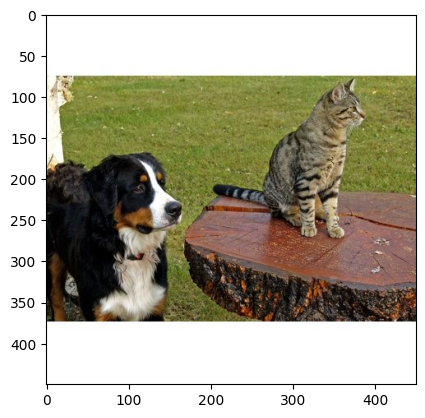

In [ ]:
img = get_image('AIMS_XAI_Inga/data/cat_dog.png')
plt.imshow(img)
plt.show()

### LIME

In [ ]:
explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(np.array(pill_transf(img)),
                                         prediction_function,
                                         # number of labels (with highest prob) to show
                                         top_labels=5,
                                         # size of the neighborhood to learn the linear model
                                         num_samples=1000)

  0%|          | 0/1000 [00:00<?, ?it/s]

In [ ]:
explanation.top_labels

[np.int64(240), np.int64(239), np.int64(241), np.int64(238), np.int64(281)]

In [ ]:
top_classes = [labels_dict[_label] for _label in explanation.top_labels]
print(top_classes)

['Appenzeller', 'Bernese mountain dog', 'EntleBucher', 'Greater Swiss Mountain dog', 'tabby, tabby cat']


Overlay the mask on from LIME on the image to see which areas encourage the top prediction

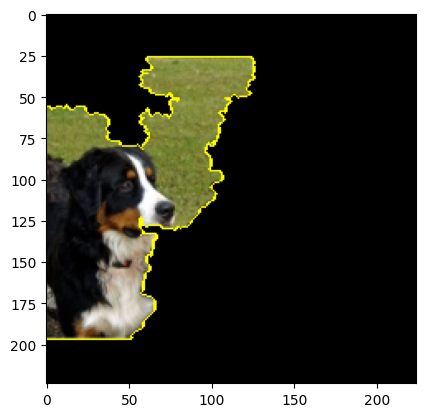

In [ ]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[1],
                                              # only include superpixels contributing positively
                                             positive_only=True,
                                             # number of superpixels to show
                                             num_features=6,
                                             # turn off the non-explanation part
                                             hide_rest=True)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

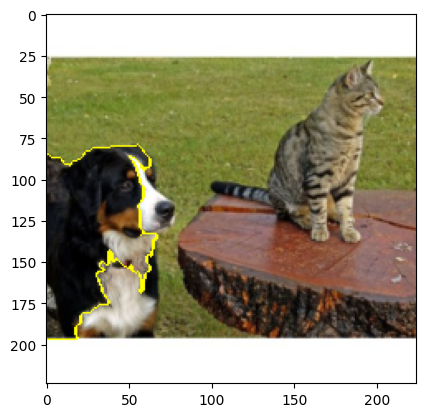

In [ ]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[1],
                                              # only include superpixels contributing positively
                                             positive_only=True,
                                             # number of superpixels to show
                                             num_features=3,
                                             # turn off the non-explanation part
                                             hide_rest=False)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

Display areas also areas that contribute against the top prediction.

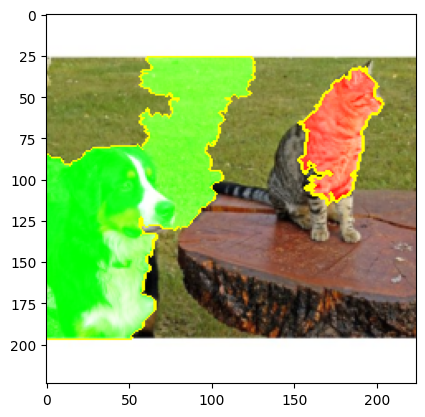

In [ ]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[1],
                                                         positive_only=False,
                                                         negative_only=False,
                                                           num_features=7,
                                                         hide_rest=False)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

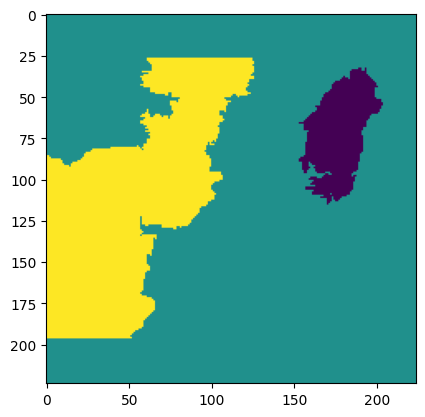

In [ ]:
plt.imshow(mask)
plt.show()

In [ ]:
np.unique(np.array(mask))

array([-1,  0,  1])

## Other images

  0%|          | 0/1000 [00:00<?, ?it/s]

['tench, Tinca tinca', 'bolete', 'armadillo', 'isopod', 'mud turtle']


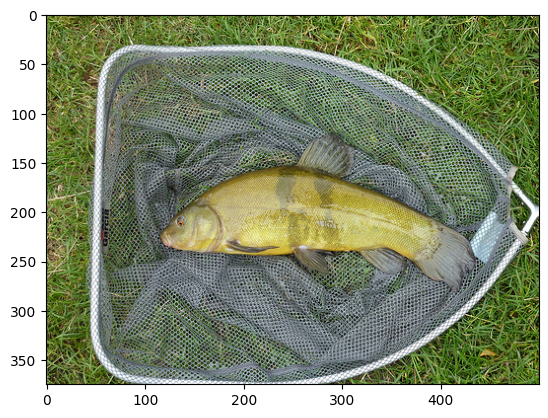

In [ ]:
img = get_image('AIMS_XAI_Inga/data/fish.jpg')
plt.imshow(img)

explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(np.array(pill_transf(img)),
                                         prediction_function,
                                         top_labels=5,
                                         num_samples=1000)

top_classes = [labels_dict[_label] for _label in explanation.top_labels]
print(top_classes)

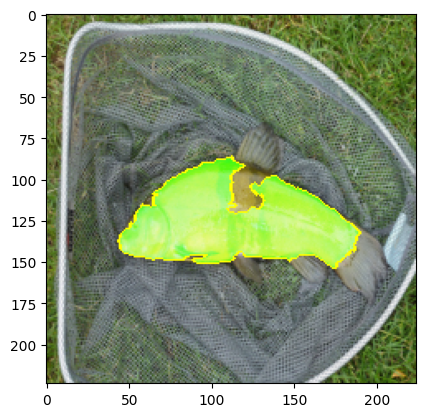

In [ ]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[0],
                                             positive_only=False,
                                             num_features=3,
                                             hide_rest=False)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

['coral reef', 'scuba diver', 'rock beauty, Holocanthus tricolor', 'jellyfish', 'anemone fish']


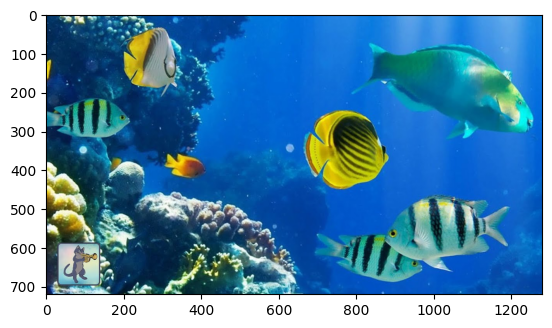

In [ ]:
img = get_image('AIMS_XAI_Inga/data/aquarium.jpg')
plt.imshow(img)

explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(np.array(pill_transf(img)),
                                         prediction_function,
                                         top_labels=5,
                                         num_samples=1000)

top_classes = [labels_dict[_label] for _label in explanation.top_labels]
print(top_classes)

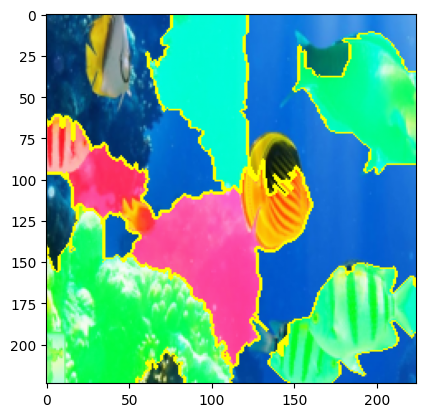

In [ ]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[0],
                                             positive_only=False,
                                             num_features=10,
                                             hide_rest=False)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

## Your own picture

In [ ]:
!curl -L "https://media.istockphoto.com/id/607900886/photo/training-class-students-learning-at-pc-discussion.jpg?s=612x612&w=0&k=20&c=eXUzFCxDyNNF7loEug9eJa6BHC8Gh_ReR_Lk5xDcQAA=" -o custom_image.jpg

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 36450  100 36450    0     0   240k      0 --:--:-- --:--:-- --:--:--  240k


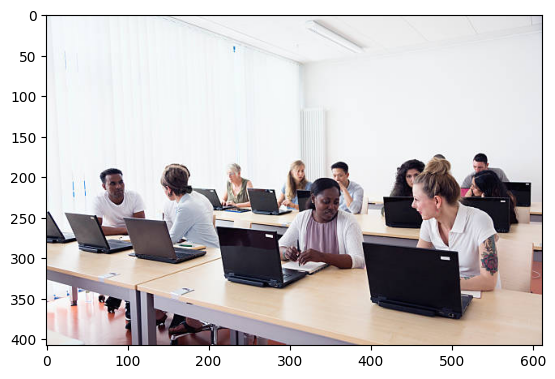

In [ ]:
img = get_image('custom_image.jpg')
plt.imshow(img)
plt.show()

In [ ]:
explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(np.array(pill_transf(img)),
                                         prediction_function,
                                         top_labels=5,
                                         num_samples=5000)

  0%|          | 0/5000 [00:00<?, ?it/s]

In [ ]:
top_classes = [labels_dict[_label] for _label in explanation.top_labels]
print(top_classes)

['notebook, notebook computer', 'laptop, laptop computer', 'lab coat, laboratory coat', 'desk', 'projector']


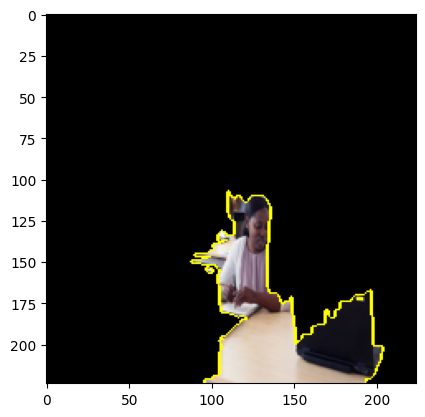

In [ ]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[1],
                                             positive_only=True,
                                             #negative_only=False,
                                             num_features=3,
                                             hide_rest=True)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

## titanic LIME

In [ ]:
!pip install lime

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import seaborn as sns #conda install seaborn
import matplotlib.pyplot as plt
import xgboost
from IPython.display import display, HTML # conda install ipython
from lime.lime_tabular import LimeTabularExplainer
# Depending on conda environment, conda install -c conda-forge lime  OR pip install lime

## Data

#### First, get the .csv file containing the titanic data from https://calmcode.io/static/data/titanic.csv

In [ ]:
!curl -LO https://calmcode.io/static/data/titanic.csv
!mv titanic.csv titanic_data.csv

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 39720  100 39720    0     0  90242      0 --:--:-- --:--:-- --:--:-- 90068


In [ ]:
filepath='titanic_data.csv'#'../data/titanic_data.csv'
df = pd.read_csv(filepath)
df = df[["pclass","sex","age","survived"]]
df.dropna(inplace=True)

features = df.columns

# Column sex is type string. Encode it to numerical
mapping = {"female": 0, "male": 1}
df["sex"] = df["sex"].map(mapping)

# Train test split
X_data = df[['pclass', 'sex', 'age']].values
y_data = df['survived'].values
X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.3)

## Models

In [ ]:
def accuracy(true_values, predictions):
    return np.mean(true_values == predictions)

In [ ]:
classifier = xgboost.XGBClassifier()
classifier.fit(X_train, y_train)

probs = classifier.predict(X_test)

print("Model accuracy: ", accuracy(y_test, probs))

Model accuracy:  0.8


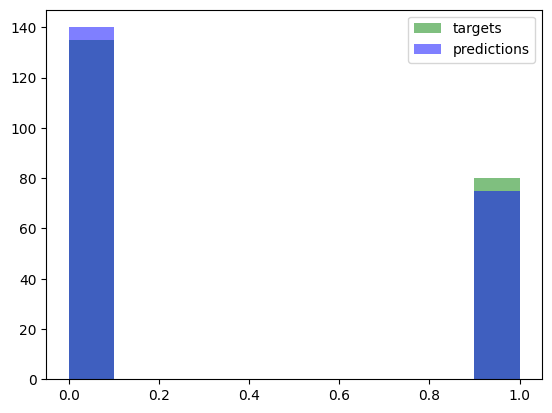

In [ ]:
plt.hist(y_test, color="green", alpha=0.5, label="targets")
plt.hist(probs, color="blue", alpha=0.5, label="predictions")
plt.legend()
plt.show()

In [ ]:
regressor = xgboost.XGBRegressor(random_state=50)
regressor.fit(X_train, y_train)
probs = regressor.predict(X_test)
classes = [0 if _p<0.5 else 1 for _p in probs]
print("Model accuracy: ", accuracy(y_test, classes))

Model accuracy:  0.7767441860465116


### LIME

In [ ]:
# Instantiate explainer objects
lime_regressor = LimeTabularExplainer(X_train,
                                        feature_names=features,
                                        verbose=True,
                                        mode='regression')

lime_classifier = LimeTabularExplainer(X_train,
                                        feature_names=features,
                                        verbose=True,
                                        mode='classification')

In [ ]:
X_jack = np.array([3,1,21])
X_rose = np.array([1,0,17])

arguments to the explain_instance method:
1) feature values of data point to explain
2) prediction function (of the model to explain)
3) top features to include

In [ ]:
exp_lime = lime_classifier.explain_instance(X_jack, classifier.predict_proba, num_features=3)

exp_lime.show_in_notebook()
# Workaround with same kwargs as show_in_notebook
#html = exp_lime.as_html()
#display(HTML(html))

Intercept 0.8292601208812216
Prediction_local [0.0577324]
Right: 0.07018907


In [ ]:
exp_lime = lime_regressor.explain_instance(X_jack, regressor.predict, num_features=3)
html = exp_lime.as_html()
display(HTML(html))

Intercept 0.8374407566762394
Prediction_local [0.08742046]
Right: 0.08052015


Interpreting the output:


Intercept: the constant in the linear model’s prediction for the test array

Prediction_local: surrogate model prediction, trained on the perturbed samples* using LIME’s top k features

Right: full model prediction for the test array

Visualisations: blue = negative; orange = positive contributions

*obtained by sampling around the test vector following a normal distribution

In [ ]:
exp_lime = lime_classifier.explain_instance(X_rose, classifier.predict_proba, num_features=3)
html = exp_lime.as_html()
display(HTML(html))

Intercept 0.10937612328679508
Prediction_local [1.10893132]
Right: 0.99280304


In [ ]:
exp_lime = lime_regressor.explain_instance(X_rose, regressor.predict, num_features=3)
html = exp_lime.as_html()
display(HTML(html))

Intercept 0.11497401570266091
Prediction_local [1.16195832]
Right: 1.0012078


In [ ]:
X_kid = np.array([3, 0, 16])
regressor.predict([X_kid])

array([0.5032671], dtype=float32)

In [ ]:
exp_lime = lime_regressor.explain_instance(X_kid, regressor.predict, num_features=3)
html = exp_lime.as_html()
display(HTML(html))

Intercept 0.39730780638833085
Prediction_local [0.69436735]
Right: 0.5032671


In [ ]:
X_kid = np.array([3, 1, 9])
regressor.predict([X_kid])

array([0.9859373], dtype=float32)

In [ ]:
exp_lime = lime_regressor.explain_instance(X_kid, regressor.predict, num_features=3)
html = exp_lime.as_html()
display(HTML(html))

Intercept 0.7532363732819449
Prediction_local [0.32453885]
Right: 0.9859373


#Homework 4: shapeley values

## Calculation of the shapeley value for each of the three cats.

* cat 1:

$p_1={{1!(3-0-1)!}\over{3!}}(2-0) +{{1!(3-1-1)!}\over{3!}}(3-4)+{{1!(3-1-1)!}\over{3!}}(3-5)+{{1!(3-2-1)}\over{3!}}(3-2)={{1}\over{2}}$

* cat 2

$p_2={{1!(3-0-1)!}\over{3!}}(4-0) +{{1!(3-1-1)!}\over{3!}}(3-2)+{{1!(3-1-1)!}\over{3!}}(2-5)+{{1!(3-2-1)}\over{3!}}(3-3)=1$

* cat 3

$p_3={{1!(3-0-1)!}\over{3!}}(5-0) +{{1!(3-1-1)!}\over{3!}}(3-2)+{{1!(3-1-1)!}\over{3!}}(2-4)+{{1!(3-2-1)}\over{3!}}(3-3)={{3}\over{2}}$


In [ ]:
!pip install dcor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.6/58.6 kB 4.7 MB/s eta 0:00:00


In [ ]:
from itertools import combinations
import numpy as np
import pandas as pd
from sklearn.datasets import load_diabetes
import seaborn as sns
import matplotlib.pyplot as plt
import dcor # pip install dcor
import xgboost
from sklearn.model_selection import train_test_split

In [ ]:
import math

## implementation of shapeley value calculation

In [ ]:
def calc_shapley_value(player_index, all_players, cf_dict:dict):
    """
    Calculate the Shapley value for player index
    Input:
        all_players, list of player indices
        cf_dict, dictionary containing characteristic function values for all players
    """
    players = all_players.copy()
    if player_index in players:
        players.remove(player_index)

    #TODO
    shapeley_value=0
    sets_by_size = dict()
    for subset in cf_dict.keys():
      sets_by_size[len(subset)] = sets_by_size.get(len(subset),[])+[subset]


    #print("sizes", sets_by_size.keys())
    N= len(players)+1
    factorial_N = math.factorial(N)
    for size in range(1, N+1):
      coef=math.factorial(size-1)*math.factorial(len(players)+1-size)
      coalition=0
      for subset in sets_by_size[size]:
        if player_index in subset:
          subset_minus_player =list(subset)
          subset_minus_player.remove(player_index)
          coalition += cf_dict[subset]-cf_dict[tuple(subset_minus_player)]
      shapeley_value += coef*coalition
    return shapeley_value/factorial_N

# The Shapley decomposition

### Cab sharing 1

In [ ]:
players = [1,2,3]
cf_dict = {():0, (1,):3, (2,):7, (3,):10,
           (1,2):7, (1,3):10, (2,3):10,
           (1,2,3):10}

print(calc_shapley_value(1, players, cf_dict))
print(calc_shapley_value(2, players, cf_dict))
print(calc_shapley_value(3, players, cf_dict))

1.0
3.0
6.0


### Cab sharing 2

In [ ]:
players = [1,2,3,4]
cf_dict = {():0, (1,):0, (2,):3, (3,):3, (4,):7,
           (1,2):3, (1,3):3, (1,4):7, (2,3):3, (2,4):7, (3,4):7,
           (1,2,3):3, (1,2,4):7, (1,3,4):7, (2,3,4):7,
           (1,2,3,4):7}

print(calc_shapley_value(1, players, cf_dict))
print(calc_shapley_value(2, players, cf_dict))
print(calc_shapley_value(3, players, cf_dict))
print(calc_shapley_value(4, players, cf_dict))

0.0
1.0
1.0
5.0


### Cat and mice

In [ ]:
players = [1,2,3]
cf_dict = {():0, (1,):2, (2,):4, (3,):5, (1,2):3, (1,3):3, (2,3):2, (1,2,3):3}
print(calc_shapley_value(1, players, cf_dict))
print(calc_shapley_value(2, players, cf_dict))
print(calc_shapley_value(3, players, cf_dict))

0.5
1.0
1.5


# From game theory to machine learning

## Data and correlation

In [ ]:
X_data, y_data = load_diabetes(scaled=True, as_frame=True, return_X_y=True)
features = X_data.columns.to_numpy()
features

array(['age', 'sex', 'bmi', 'bp', 's1', 's2', 's3', 's4', 's5', 's6'],
      dtype=object)

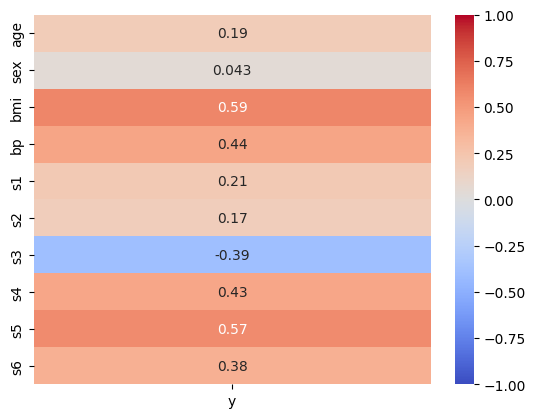

In [ ]:
df = pd.concat([X_data, y_data.rename("y")], axis=1)
corr = df.corr(numeric_only=True)
sns.heatmap(corr.loc[X_data.columns, ["y"]], annot=True, vmin=-1, vmax=1, cmap="coolwarm")
plt.show()

## The Shapley value for the target, using as characteristic function the linear correlation R²

In [ ]:
def calc_shapley_values(x, cf_dict):
    """
    Returns the shapley values for features x, given a
    dictionary cf_dict containing the characteristic function values.
    """

    players = list(range(x.shape[1]))
    shapley_values = []
    for _player in players:
        shapley_values.append(calc_shapley_value(_player, players, cf_dict))
    return shapley_values

def sort_shapley_values(values, features):
    return zip(*sorted(zip(values, features), reverse=True))

def flatten(tup):
    """
    Flatten any nested tuple
    """
    if len(tup) < 1:
        return tup
    if isinstance(tup[0], tuple):
        return flatten(tup[0]) + flatten(tup[1:])
    return tup[:1] + flatten(tup[1:])

def make_cf_dict(x, y, characteristic_function):
    """
    Creates dictionary with values of the characteristic function for each
    combination of the players.
    """
    cf_dict = {}
    num_players = x.shape[1]
    players = list(range(num_players))
    coalition_sizes = list(range(num_players+1))

    for _size in coalition_sizes:
        coalitions_of_size_s = list(combinations(players, _size))
        for _coalition in coalitions_of_size_s:
            _coalition = tuple(sorted(flatten(_coalition)))
            cf_dict[_coalition] = characteristic_function(x, y, _coalition)

    return cf_dict

def characteristic_function_r2(x, y, coalition):
    """
    Returns the coefficient of determination between the indices of x indicated in coalition and y
    Input:
        x, numpy array shape (#samples, #features)
        y, numpy array shape (#samples, )
        coalition, tuple of indices of features to include
    """
    if len(coalition)==0:
        return 0.0
    x = x[:, coalition]

    # --- Coefficient of determination, R2
    det_C_xy = np.linalg.det(np.corrcoef(x.T, y))
    if len(coalition)==1:
        det_C_x = 1
    else:
        det_C_x = np.linalg.det(np.corrcoef(x.T))

    return (1 - det_C_xy/det_C_x)

In [ ]:
cf_dict_R2 = make_cf_dict(X_data.to_numpy(), y_data.to_numpy(), characteristic_function_r2)
print(len(cf_dict_R2))
print(2**len(features))

1024
1024


In [ ]:
shapley_values = calc_shapley_values(X_data.to_numpy(), cf_dict_R2)

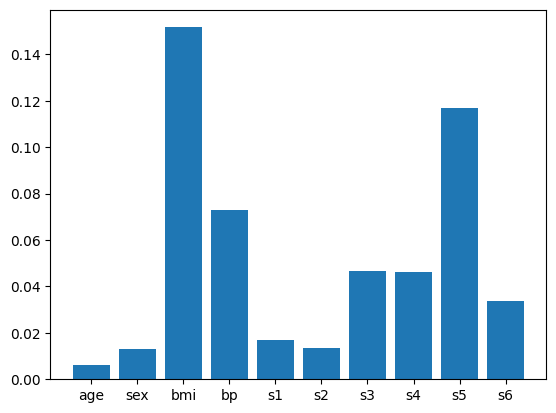

In [ ]:
plt.bar(range(len(shapley_values)), shapley_values)
plt.xticks(range(len(shapley_values)), features)
plt.show()

In [ ]:
print("Sum of the Shapley values: ", sum(shapley_values))
print("Value of the grand coalition: ", cf_dict_R2[list(cf_dict_R2.keys())[-1]])

Sum of the Shapley values:  0.5177484222203484
Value of the grand coalition:  0.5177484222203484


## The Shapley value for the target, using as characteristic function the distance correlation

In [ ]:
def characteristic_function_dcor(x, y, coalition):
    if len(coalition)==0:
        return 0.0

    x = x[:, coalition]

    return dcor.distance_correlation(x,y)

In [ ]:
cf_dict_dcor = make_cf_dict(X_data.to_numpy(), y_data.to_numpy(), characteristic_function_dcor)
shapley_values_dcor = calc_shapley_values(X_data, cf_dict_dcor)

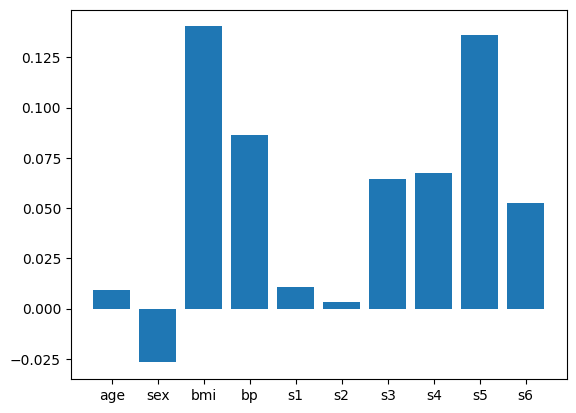

In [ ]:
plt.bar(range(len(shapley_values_dcor)), shapley_values_dcor)
plt.xticks(range(len(shapley_values_dcor)), features)
plt.show()

In [ ]:
_, sorted_features = sort_shapley_values(shapley_values, features)
print(sorted_features)
_, sorted_features_dcor = sort_shapley_values(shapley_values_dcor, features)
print(sorted_features_dcor)

('bmi', 's5', 'bp', 's3', 's4', 's6', 's1', 's2', 'sex', 'age')
('bmi', 's5', 'bp', 's4', 's3', 's6', 's1', 'age', 's2', 'sex')


# Shapley values for a model

### Train and evaluate regressor

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.33, random_state=42)

regressor = xgboost.XGBRegressor()
regressor.fit(x_train, y_train);

In [ ]:
y_pred = regressor.predict(x_test)

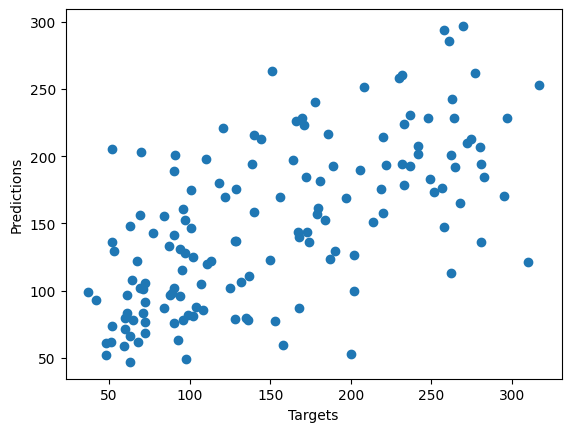

In [ ]:
plt.scatter(y_test, y_pred)
plt.xlabel("Targets")
plt.ylabel("Predictions")
plt.show()

### Compare Shapley values for target and predictions

In [ ]:
cf_dict_dcor_targets = make_cf_dict(x_test.to_numpy(), y_test.to_numpy(), characteristic_function_dcor)
shapley_values_targets = calc_shapley_values(x_test.to_numpy(), cf_dict_dcor_targets)

In [ ]:
cf_dict_dcor_preds = make_cf_dict(x_test.to_numpy(), np.array(y_pred), characteristic_function_dcor)
shapley_values_preds = calc_shapley_values(x_test.to_numpy(), cf_dict_dcor_preds)

/usr/local/lib/python3.12/dist-packages/dcor/_fast_dcov_avl.py:554: UserWarning: Falling back to uncompiled AVL fast distance covariance terms because of TypeError exception raised: No matching definition for argument type(s) array(float64, 1d, C), array(float32, 1d, C), bool. Rembember: only floating point values can be used in the compiled implementations.
  warnings.warn(


In [ ]:
def plot_shapley_comparison(values_0, values_1,feature_names=None, nametags=[0,1]):
    assert len(values_0) == len(values_1)
    num = range(1,len(values_0)+1)
    colors = ["blue", "pink"]

    for _n, _values in enumerate([values_0, values_1]):
        _col = colors[_n]
        plt.scatter(num,_values,c=_col,marker='s',alpha=0.7,label=f"Shapley values {nametags[_n]}")

    plt.ylabel("Shapley values")
    plt.legend()
    if feature_names is not None:
        ax = plt.gca()
        ax.set_xticks(num)
        ax.set_xticklabels(feature_names,rotation=45)
    plt.show()

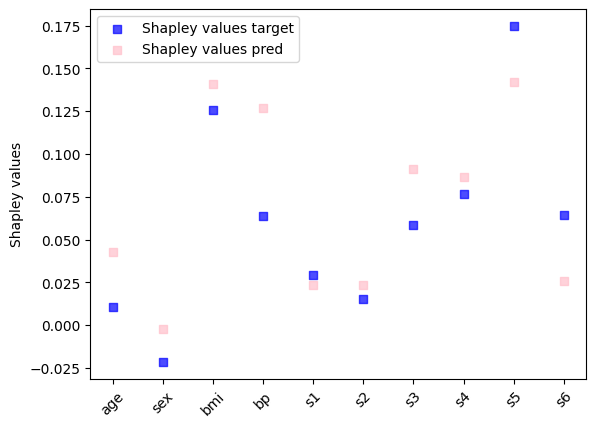

In [ ]:
plot_shapley_comparison(shapley_values_targets, shapley_values_preds, features, ["target", "pred"])

#HomeWork 5: SHAP

In [ ]:
import numpy as np
import os
import pandas as pd
import shap
import xgboost
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.datasets import load_diabetes
shap.initjs() # Don't worry if this doesn't work for you. Comment it out and carry on

# conda install pytorch::pytorch
# conda install pytorch::torchvision
import torch
from torch import optim, nn
from torchvision import transforms, datasets
import torch.nn.functional as F

## Tabular data

## Data and model

In the diabetes dataset, each y value reflects how much a patient’s condition progressed after a year

In [ ]:
X_data, y_data = load_diabetes(scaled=False, as_frame=True, return_X_y=True)
features = X_data.columns.to_numpy()
features

array(['age', 'sex', 'bmi', 'bp', 's1', 's2', 's3', 's4', 's5', 's6'],
      dtype=object)

In [ ]:
# I also love np arrays, but keep the dataframe structure if you want feature names on your SHAP plot
x_train, x_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.33, random_state=42)

In [ ]:
regressor = xgboost.XGBRegressor()
regressor.fit(x_train, y_train);

## SHAP explainer and plot

Initialise explainer on the model, and (for now) specify a background data set.
This causes SHAP to estimate the expectation by marginalising missing features independently (using the background data), thus breaking empirical feature correlations

In [ ]:
explainer = shap.TreeExplainer(regressor, data=x_train)
shap_values = explainer.shap_values(x_test)

First, make the typical SHAP plot.
Remember from yesterday's Shapley values that bmi was important, while age was (up to third) least important

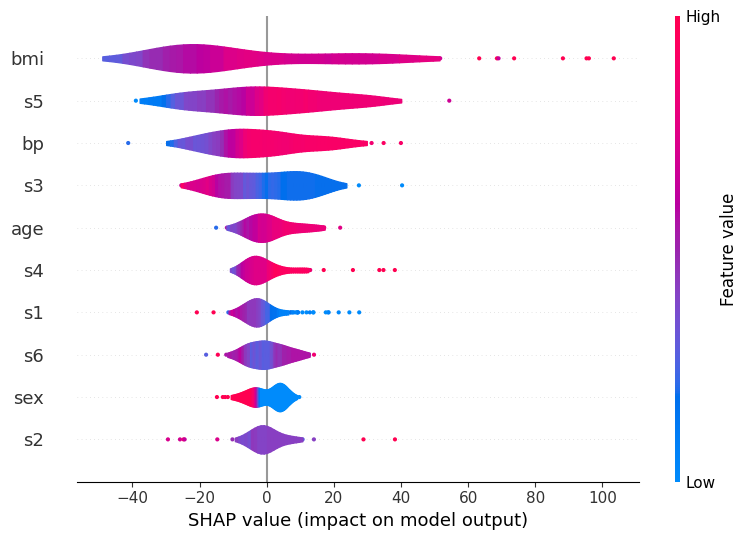

In [ ]:
shap.summary_plot(shap_values, x_test, plot_type="violin")

Let's look closer at a single instance and use SHAP to explain the prediction

In [ ]:
y_pred = regressor.predict(x_test)
index = 2
print("Mean BMI in test data:", np.mean(x_test.bmi))
print("Mean prediction on test data:", np.mean(y_pred))
print("Prediction on our data point:", y_pred[index])
print("Data point:")
print(x_test.iloc[index])

shap.force_plot(explainer.expected_value, shap_values[index,:], x_test.iloc[index,:])

Mean BMI in test data: 26.043150684931508
Mean prediction on test data: 149.2698
Prediction on our data point: 126.554016
Data point:
age     66.0000
sex      2.0000
bmi     26.0000
bp      91.0000
s1     264.0000
s2     146.6000
s3      65.0000
s4       4.0000
s5       5.5683
s6      87.0000
Name: 72, dtype: float64


In [ ]:
print(explainer.expected_value)
print(sum(shap_values[index, :]))
print(regressor.predict(x_test)[index])
print(explainer.expected_value + sum(shap_values[index, :]))

154.44574596805717
-27.891726560560564
126.554016
126.55401940749661


In [ ]:
print("Base value + sum of the SHAP values=", explainer.expected_value + sum(shap_values[index,:]))

Base value + sum of the SHAP values= 126.55401940749661


Remember that the base value represents the expected model prediction without any feature values, so the mean prediction on the background data (in our case the training data). Check if this is the case:

In [ ]:
base = explainer.expected_value
mean_pred = regressor.predict(x_train).mean()
mean_y = y_train.mean()
print("Base value:", base, "\nMean prediction on training data:", mean_pred)

Base value: 154.44574596805717 
Mean prediction on training data: 151.98286


The two values are not exactly equal because the base value is estimated assuming feature independence.

If we instead let SHAP use the tree to estimate this value, it aligns more closely with the actual prediction on the test data.

In [ ]:
explainer = shap.TreeExplainer(regressor, feature_perturbation="tree_path_dependent")
shap_values = explainer.shap_values(x_test)
base = explainer.expected_value
mean_pred = regressor.predict(x_train).mean()
print("Base value:", base, "\nMean prediction on training data:", mean_pred)

Base value: 151.98288 
Mean prediction on training data: 151.98286


## MNIST

In [ ]:
batch_size = 64

train_loader = torch.utils.data.DataLoader(
    datasets.MNIST("mnist_data",
        train=True,
        download=True,
        transform=transforms.Compose([transforms.ToTensor()]),
    ),
    batch_size=batch_size,
    shuffle=True,
)

test_loader = torch.utils.data.DataLoader(
    datasets.MNIST("mnist_data",
        train=False,
        transform=transforms.Compose([transforms.ToTensor()])),
    batch_size=batch_size,
    shuffle=True,
)

100%|██████████| 9.91M/9.91M [00:00<00:00, 12.8MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 343kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 3.18MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 6.84MB/s]


B (Batch size): 64,

C (Channels): 1,

H (Height): 28,

W (Width): 28

In [ ]:
# This cell is just for understanding the data loader objects
imgs, lbls = next(iter(test_loader))
print(imgs.shape)  # torch.Size([B, C, H, W])
print(lbls.shape)  # torch.Size([B])

torch.Size([64, 1, 28, 28])
torch.Size([64])


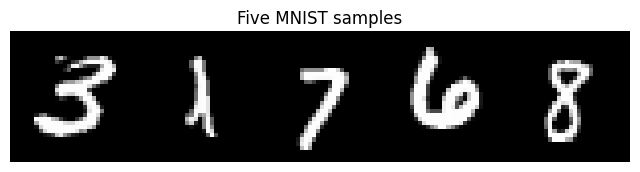

In [ ]:
# This cell is just for looking at some of the images
from torchvision.utils import make_grid
imgs5 = imgs[:5]

# Make a grid and plot
grid = make_grid(imgs5, nrow=5, padding=2)
plt.figure(figsize=(8, 2))
plt.imshow(grid.permute(1, 2, 0).squeeze(), cmap="gray")
plt.axis("off")
plt.title("Five MNIST samples")
plt.show()

### Train/load and test a simple pytorch model

In [ ]:
num_epochs = 5
device = torch.device("cpu")

class Net(nn.Module):
    def __init__(self):
        super().__init__()

        self.conv_layers = nn.Sequential(
            nn.Conv2d(1, 10, kernel_size=5),
            nn.MaxPool2d(2),
            nn.ReLU(),
            nn.Conv2d(10, 20, kernel_size=5),
            nn.Dropout(),
            nn.MaxPool2d(2),
            nn.ReLU(),
        )
        self.fc_layers = nn.Sequential(
            nn.Linear(320, 50),
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(50, 10),
            nn.Softmax(dim=1),
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = x.view(-1, 320)
        x = self.fc_layers(x)
        return x


def train(model, device, train_loader, optimizer, epoch):
    model.train()
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = F.nll_loss(output.log(), target)
        loss.backward()
        optimizer.step()
        if batch_idx % 100 == 0:
            print(
                f"Train Epoch: {epoch} [{batch_idx * len(data)}/{len(train_loader.dataset)}"
                f" ({100.0 * batch_idx / len(train_loader):.0f}%)]"
                f"\tLoss: {loss.item():.6f}"
            )


def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output.log(), target).item()  # sum up batch loss
            pred = output.max(1, keepdim=True)[1]  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)
    print(
        f"\nTest set: Average loss: {test_loss:.4f},"
        f" Accuracy: {correct}/{len(test_loader.dataset)}"
        f" ({100.0 * correct / len(test_loader.dataset):.0f}%)\n"
    )

model = Net().to(device)
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.5)

model_file = "mnist_cnn.pt"

if os.path.isfile(model_file):
    print(f"Found model file {model_file}. Loading...")
    state = torch.load(model_file, map_location=device, weights_only=True)
    model.load_state_dict(state, strict=True)
    test(model, device, test_loader)

else:
    print(f"Found no model saved as {model_file}. Training...")
    for epoch in range(1, num_epochs + 1):
        train(model, device, train_loader, optimizer, epoch)
        torch.save(model.state_dict(), model_file)
        test(model, device, test_loader)


Found no model saved as mnist_cnn.pt. Training...
Train Epoch: 1 [0/60000 (0%)]	Loss: 2.292653
Train Epoch: 1 [6400/60000 (11%)]	Loss: 2.226984
Train Epoch: 1 [12800/60000 (21%)]	Loss: 1.771665
Train Epoch: 1 [19200/60000 (32%)]	Loss: 1.038478
Train Epoch: 1 [25600/60000 (43%)]	Loss: 0.655823
Train Epoch: 1 [32000/60000 (53%)]	Loss: 1.233288
Train Epoch: 1 [38400/60000 (64%)]	Loss: 0.659330
Train Epoch: 1 [44800/60000 (75%)]	Loss: 0.648648
Train Epoch: 1 [51200/60000 (85%)]	Loss: 0.454764
Train Epoch: 1 [57600/60000 (96%)]	Loss: 0.410779

Test set: Average loss: 0.0054, Accuracy: 9291/10000 (93%)

Train Epoch: 2 [0/60000 (0%)]	Loss: 0.303743
Train Epoch: 2 [6400/60000 (11%)]	Loss: 0.490716
Train Epoch: 2 [12800/60000 (21%)]	Loss: 0.374723
Train Epoch: 2 [19200/60000 (32%)]	Loss: 0.391667
Train Epoch: 2 [25600/60000 (43%)]	Loss: 0.234958
Train Epoch: 2 [32000/60000 (53%)]	Loss: 0.426340
Train Epoch: 2 [38400/60000 (64%)]	Loss: 0.273038
Train Epoch: 2 [44800/60000 (75%)]	Loss: 0.402155
T

Use the model to predict on test data

Label: 4
Prediction: 4
Probabilities: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]


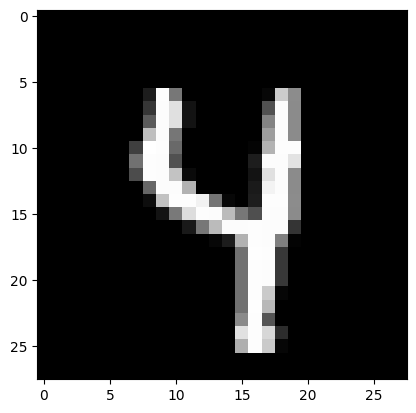

In [ ]:
index = 2
model.eval()
with torch.no_grad():
    images, labels = next(iter(test_loader))
    x = images[index-1:index].to(device)
    y = labels[index-1].to(device)

    output = model(x)
    pred = output.argmax(dim=1).item()

print("Label:", y.item())
print("Prediction:", pred)
print(f"Probabilities: {np.round(output.numpy()[0],2)}")

plt.imshow(x.squeeze(), cmap="gray")
plt.show()

### SHAP

Build a small background set (reference distribution)

In [ ]:
# Use ~50–200 images to keep it fast
background, _ = next(iter(train_loader))
background = background[:50].to(device)   # [50, 1, 28, 28]
background.shape

torch.Size([50, 1, 28, 28])

 Create the explainer

In [ ]:
explainer = shap.DeepExplainer(model, background)

Pick a few samples to explain

In [ ]:
test_samples, test_labels = next(iter(test_loader))
N = test_samples.size(0)
idx = torch.randperm(N)[:5]
test_samples = test_samples[idx]          # [5, 1, 28, 28]
test_labels = test_labels[idx]
test_samples.shape

torch.Size([5, 1, 28, 28])

Compute SHAP values

Returns a list with one array per data point: shap_values[data_index].shape == [1, 28, 28, 10]

In [ ]:
shap_values = explainer.shap_values(test_samples)
shap_values[0].shape

(1, 28, 28, 10)

For the plot, we call image_plot(shap_values, pixel_values). This function needs input as:

shap_values: [numpy.array:]:
    List of numpy arrays of SHAP values. Each array has the shape [samples, W, H, C], and length equal to the number of model outputs.

pixel_values: numpy.array:
    Matrix of pixel values [samples, W, H, C] for each image. It should be the same shape as each array in the shap_values list of arrays.

In [ ]:
shap_numpy = list(np.transpose(shap_values, (4, 0, 2, 3, 1)))
test_numpy = np.swapaxes(np.swapaxes(test_samples.numpy(), 1, -1), 1, 2)
print(len(shap_numpy))     # 10
print(shap_numpy[0].shape) # (5, 28, 28, 1)
print(test_numpy.shape)    # (5, 28, 28, 1)

10
(5, 28, 28, 1)
(5, 28, 28, 1)


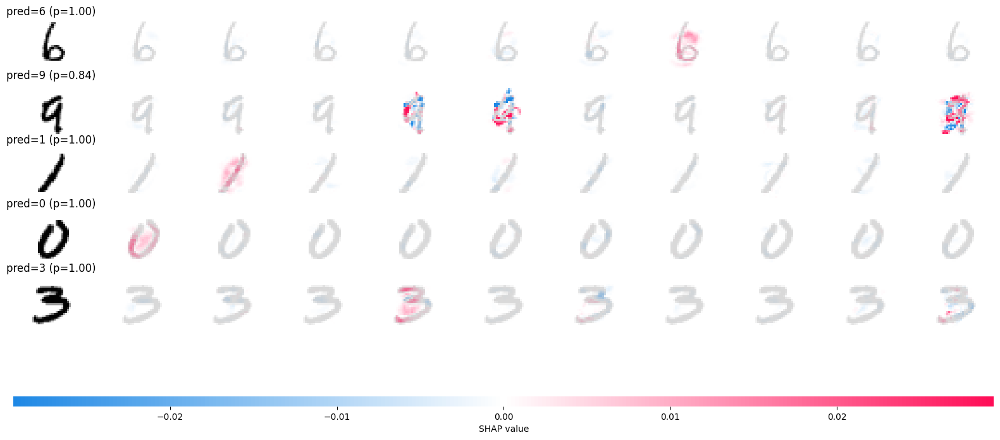

In [ ]:
probs = model(test_samples).detach().numpy()      # [N,10]
pred_cls = probs.argmax(axis=1)
row_labels = [f"pred={int(pred_cls[i])} (p={probs[i, pred_cls[i]]:.2f})" for i in range(len(pred_cls))]

shap.image_plot(shap_numpy, -test_numpy, true_labels=row_labels)

The shape of the explainer.expected value corresponds to the number of classes. There is one expected prediction = baseline per class

In [ ]:
explainer.expected_value

array([0.10104352, 0.12237937, 0.08273964, 0.09381901, 0.09031684,
       0.15670055, 0.08017471, 0.0851841 , 0.10178425, 0.08585798],
      dtype=float32)

In [ ]:
sum(explainer.expected_value)

np.float32(0.99999994)